<a href="https://colab.research.google.com/github/ritwiks9635/Segmentation-Model/blob/main/Pathole_Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Pathole Image Segmentation**

#**🛣Pothole Segmentation for Road Damage Assessment Project Overview**
This project employs YOLOv8-seg to automate the detection and analysis of road damage, focusing on potholes. By accurately identifying and measuring the extent of potholes, the project aims to enhance road repair initiatives and provide real-time hazard alerts, significantly improving road safety and contributing to smart urban planning. The fusion of computer vision with critical road maintenance efforts marks a significant stride in the evolution of autonomous vehicle navigation and technological infrastructure development.

#**YOLOv8-seg: Precision Instance Segmentation**

Launched by Ultralytics in November 2023, the YOLOv8-seg models, denoted by the '-seg' suffix such as `yolov8n-seg.pt`, represent the forefront of instance segmentation, pretrained on the comprehensive COCO dataset. These models extend the robust object detection capabilities of YOLOv8 to provide highly precise segmentation, outlining each object in detail. Available in various sizes from 'n' to 'x', the models balance speed with accuracy, with the 'x' variant reaching a mask mean Average Precision of 43.4 on COCO benchmark dataset. YOLOv8-seg models are ideal for applications requiring detailed spatial understanding of objects.

In [1]:
#https://www.kaggle.com/datasets/ farzadnekouei/pothole-image-segmentation-dataset

In [2]:
import os
os.environ['KAGGLE_USERNAME'] = "ritwiksarkar2"
os.environ['KAGGLE_KEY'] = "93e9e00c563a5345d48b05cdb87092d9"
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()
#os path
api.dataset_download_files( "farzadnekouei/pothole-image-segmentation-dataset",path="https://www.kaggle.com/datasets/farzadnekouei/pothole-image-segmentation-dataset")
# unzip

In [ ]:
!unzip /content/https:/www.kaggle.com/datasets/farzadnekouei/pothole-image-segmentation-dataset/pothole-image-segmentation-dataset.zip

In [ ]:
!pip install ultralytics

In [5]:
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video

In [6]:
import warnings
warnings.filterwarnings("ignore")

#**🚀 Choosing YOLOv8n-seg for Speed**
The YOLOv8-seg lineup ranges from nano to xlarge, each striking a different balance between accuracy and speed. While larger models offer increased precision, they do so at the expense of response time. For our Pothole Segmentation task, which demands prompt processing, the YOLOv8n-seg is our chosen model. It's tailored for the fastest inference, making it highly suitable for real-time applications:

#**🧩 YOLOv8-seg Dataset Format**
I've formatted our dataset specifically for the YOLOv8-seg model, prepared on Roboflow. It includes all elements essential for training a segmentation model effectively. Here is a breakdown:
- 1️⃣ train and valid directories:
Our dataset is split into train and valid directories, each with images and labels subdirectories. The train contains 720 image-label pairs, while valid has 60. Label files detail the class index and normalized coordinates for each pothole instance in the [class-index] [x1] [y1] [x2] [y2] ... [xn] [yn]  format. In this format, [class-index] is the index of the class for the object, and [x1] [y1] [x2] [y2] ... [xn] [yn] are the bounding coordinates of the object's segmentation mask. The coordinates are separated by spaces.

- 2️⃣ data.yaml:
The data.yaml file which is the Ultralytics YOLO dataset configuration file. It specifies paths to the training and validation datasets, defines the number of classes (1), and the class name (‘Pothole’). This format is crucial for setting up and training the model accurately with our dataset. Let's review the data.yaml to understand the setup:

In [7]:
# Load the pre-trained YOLOv8 nano segmentation model
model = YOLO('yolov8n-seg.pt')

100%|██████████| 6.73M/6.73M [00:00<00:00, 189MB/s]


#**🗂️ Understanding the data.yaml File**
The data.yaml file is crucial for configuring our model; it locates the training (train: ../train/images) and validation (val: ../valid/images) images and specifies that we're detecting a single class (nc: 1), Pothole. This setup ensures our YOLOv8-seg model is finely tuned to identify and segment potholes from our custom dataset. It's the guide that helps our model learn precisely what to look for during the segmentation task.

In [9]:
data_path = "/content/Pothole_Segmentation_YOLOv8"

yaml_file_path = os.path.join(data_path, "data.yaml")

with open(yaml_file_path, "r") as file:
    yaml_contant = yaml.load(file, Loader = yaml.FullLoader)
    print(yaml.dump(yaml_contant, default_flow_style = False))

names:
- Pothole
nc: 1
roboflow:
  license: CC BY 4.0
  project: pothole_segmentation_yolov8
  url: https://universe.roboflow.com/farzad/pothole_segmentation_yolov8/dataset/1
  version: 1
  workspace: farzad
train: ../train/images
val: ../valid/images



In [10]:
os.listdir(data_path)

['valid',
 'README.roboflow.txt',
 'train',
 'README.dataset.txt',
 'data.yaml',
 'sample_video.mp4']

In [11]:
train_img_path = os.path.join(data_path, "train", "images")

val_img_path = os.path.join(data_path, "valid", "images")

num_train_imgs = 0
num_val_imgs = 0

train_img_size = set()
val_img_size = set()


for filename in os.listdir(train_img_path):
    if filename.endswith(".jpg"):
        num_train_imgs += 1

        img_paths = os.path.join(train_img_path, filename)

        with Image.open(img_paths) as img:
            train_img_size.add(img.size)


for filename in os.listdir(val_img_path):
    if filename.endswith(".jpg"):
        num_val_imgs += 1

        img_paths = os.path.join(val_img_path, filename)

        with Image.open(img_paths) as img:
            val_img_size.add(img.size)


print(f"Number of training images: {num_train_imgs}")
print(f"Number of validation images: {num_val_imgs}")


if len(train_img_size) == 1:
    print(f"All training images have the same size: {train_img_size.pop()}")
else:
    print("Training images have varying sizes.")


if len(val_img_size) == 1:
    print(f"All training images have the same size: {val_img_size.pop()}")
else:
    print("Training images have varying sizes.")

Number of training images: 720
Number of validation images: 60
All training images have the same size: (640, 640)
All training images have the same size: (640, 640)


#**📊 Dataset Analysis Insights**
For our Pothole Segmentation project, the dataset comprises 720 training images and 60 validation images. All images are consistently sized at 640x640 pixels, matching the YOLOv8-seg model's input specifications. This uniformity ensures that the model trains and validates efficiently. The training to validation split provides a robust dataset for learning and a sufficient number for validation to assess the model's performance accurately.

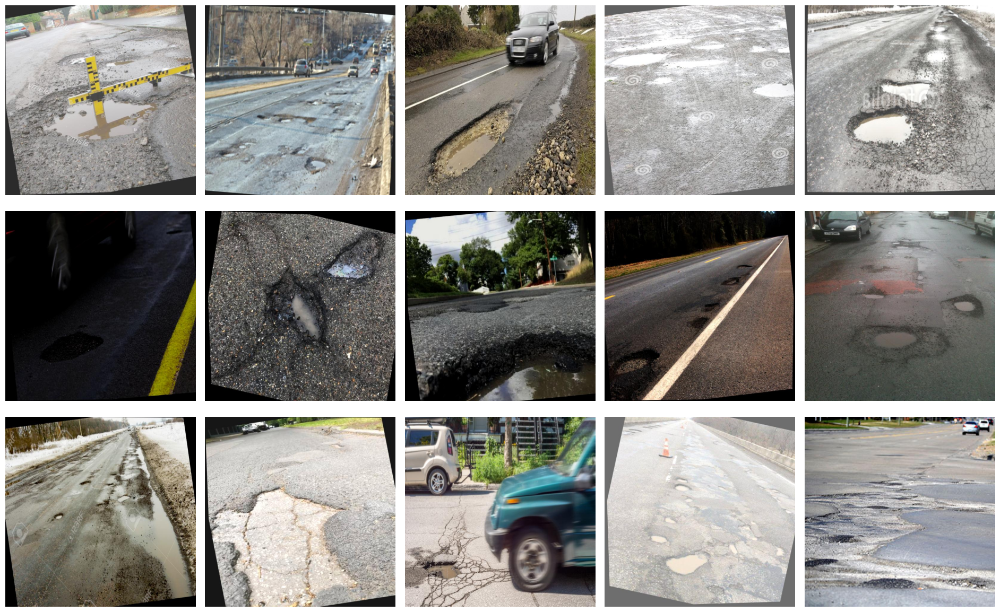

In [12]:
random.seed(0)

image_files = [f for f in os.listdir(train_img_path) if f.endswith(".jpg")]

random_imgs = random.sample(image_files, 15)

plt.figure(figsize=(19, 12))

for i, images in enumerate(random_imgs):
    image_sam = os.path.join(train_img_path, images)
    images = Image.open(image_sam)
    plt.subplot(3, 5, i+1)
    plt.imshow(images)
    plt.axis("off")

plt.tight_layout()
plt.show()

del image_files

**In this step, I'll use transfer learning to fine-tune the YOLOv8-seg model, initially trained on the COCO dataset, for our Pothole Image Segmentation Dataset. Instead of starting the training from scratch with random weights, which requires a lot of data and time, I'll start with a model that already knows how to recognize various objects. This way, we save time and make the most out of our smaller dataset to teach the model how to identify and segment potholes in road images:**

In [14]:
# Train the model on our custom dataset
results = model.train(
    data= yaml_file_path,     # Path to the dataset configuration file
    epochs=150,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    patience=15,             # Epochs to wait for no observable improvement for early stopping of training
    batch=16,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    device=0,                # Device to run on, i.e. cuda device=0
    seed=42                  # Random seed for reproducibility
)

Ultralytics YOLOv8.1.31 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/Pothole_Segmentation_YOLOv8/data.yaml, epochs=150, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tru

100%|██████████| 755k/755k [00:00<00:00, 43.3MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 169MB/s]


AMP: checks passed ✅


train: Scanning /content/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<00:00, 816.12it/s]

train: New cache created: /content/Pothole_Segmentation_YOLOv8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 314.58it/s]


val: New cache created: /content/Pothole_Segmentation_YOLOv8/valid/labels.cache
Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/150      3.11G      1.472      2.945      2.321      1.434         64        640: 100%|██████████| 45/45 [00:24<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]

                   all         60        201      0.814     0.0435      0.207      0.103      0.814     0.0435      0.214     0.0862



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/150      2.87G       1.46      2.462      1.855      1.427         59        640: 100%|██████████| 45/45 [00:18<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         60        201      0.157      0.119        0.1     0.0456      0.124     0.0945     0.0696     0.0291



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/150      2.85G        1.5      2.449      1.716      1.426         94        640: 100%|██████████| 45/45 [00:18<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         60        201       0.31      0.299      0.213     0.0913       0.32      0.308      0.209     0.0751



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/150      2.89G      1.486       2.41      1.694       1.43         71        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        201      0.433      0.433      0.401      0.199      0.449      0.448      0.406      0.195



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/150      2.87G      1.472      2.336       1.55      1.405         58        640: 100%|██████████| 45/45 [00:19<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        201      0.446       0.36      0.346      0.155      0.469      0.368      0.341      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/150      2.87G      1.459      2.331      1.506      1.402         73        640: 100%|██████████| 45/45 [00:18<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.02it/s]

                   all         60        201      0.582      0.473       0.46      0.212      0.601      0.448      0.448      0.206



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/150      2.92G       1.41      2.308       1.44      1.359         81        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        201      0.479      0.494      0.469      0.244      0.462      0.474      0.456      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/150      2.92G       1.41      2.288      1.411      1.376         51        640: 100%|██████████| 45/45 [00:18<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         60        201      0.585      0.627      0.568      0.282      0.634      0.617      0.577      0.281



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/150      2.89G      1.399      2.255      1.375      1.369         46        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         60        201      0.542      0.488      0.483      0.231      0.531      0.478      0.433      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/150       2.9G      1.385      2.238      1.338      1.365        126        640: 100%|██████████| 45/45 [00:18<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         60        201      0.583      0.517      0.553      0.277      0.588      0.522      0.543      0.269



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/150      2.89G      1.371        2.2      1.271      1.334         70        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.02s/it]

                   all         60        201      0.588      0.592      0.575      0.317      0.582      0.597      0.579      0.294



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/150      2.89G      1.382      2.216      1.308      1.371         77        640: 100%|██████████| 45/45 [00:21<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         60        201      0.588      0.627      0.601      0.326      0.602      0.641      0.611      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/150       2.8G      1.343      2.141      1.273      1.345         77        640: 100%|██████████| 45/45 [00:18<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         60        201      0.595      0.572      0.541      0.278      0.616      0.551      0.533      0.267



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/150      2.86G      1.342      2.146      1.222       1.31         65        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all         60        201      0.551      0.612      0.559      0.281       0.56      0.557      0.529      0.254



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/150      2.84G      1.311      2.123      1.173      1.302         69        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all         60        201      0.607      0.706      0.634      0.344      0.603      0.662      0.631      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/150      2.91G      1.297      2.057      1.158      1.286         68        640: 100%|██████████| 45/45 [00:17<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all         60        201      0.648      0.612      0.581      0.319      0.656      0.617      0.599      0.311



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/150      2.83G      1.278      2.044      1.151      1.262         80        640: 100%|██████████| 45/45 [00:18<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         60        201      0.595      0.572       0.59       0.31      0.597       0.59      0.594      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/150       2.9G      1.283      2.045      1.115      1.271         75        640: 100%|██████████| 45/45 [00:20<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.03it/s]

                   all         60        201      0.629      0.565      0.569        0.3      0.655      0.537      0.569      0.297



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/150      2.81G      1.282      2.087       1.13      1.288         61        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         60        201      0.682      0.637      0.651      0.358      0.709      0.642      0.652      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/150      2.84G      1.269      2.022      1.098      1.268         80        640: 100%|██████████| 45/45 [00:19<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         60        201      0.587      0.617      0.619      0.336      0.667      0.572      0.622      0.343



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/150      2.87G      1.232      1.952      1.051      1.261         83        640: 100%|██████████| 45/45 [00:17<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         60        201      0.638      0.627      0.627      0.363      0.653      0.642      0.644      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/150      2.84G      1.251      1.989      1.058      1.262         69        640: 100%|██████████| 45/45 [00:18<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         60        201      0.647      0.611       0.62       0.34      0.641      0.612      0.615      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/150      2.86G      1.246      1.969      1.054      1.258         51        640: 100%|██████████| 45/45 [00:23<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         60        201      0.612      0.607      0.634      0.366      0.646      0.632      0.655      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/150      2.85G       1.21      1.997      1.041      1.256         68        640: 100%|██████████| 45/45 [00:20<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         60        201      0.668      0.547      0.584      0.322      0.679      0.547      0.601      0.319



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/150      2.85G      1.219      1.954      1.023      1.241         77        640: 100%|██████████| 45/45 [00:18<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         60        201       0.57      0.606      0.565      0.308      0.562        0.6      0.551      0.288



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/150      2.87G      1.195      1.928     0.9916      1.234         70        640: 100%|██████████| 45/45 [00:19<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         60        201      0.683      0.552      0.609      0.358       0.72      0.577      0.644       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/150       2.9G      1.192      1.896     0.9765      1.224         79        640: 100%|██████████| 45/45 [00:18<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all         60        201      0.669      0.592      0.646      0.368      0.686      0.607       0.66      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/150      2.85G      1.199      1.914      1.006      1.235         72        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.77it/s]

                   all         60        201      0.644      0.682      0.657      0.362      0.645      0.687      0.668      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/150      2.91G      1.163      1.853     0.9661      1.213         69        640: 100%|██████████| 45/45 [00:18<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]

                   all         60        201      0.625      0.627       0.63      0.356      0.649      0.677      0.644      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/150      2.83G       1.15      1.802     0.9169      1.203         62        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         60        201      0.691      0.657      0.651      0.358      0.684      0.652      0.642       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/150      2.84G      1.164      1.861     0.9381      1.197         74        640: 100%|██████████| 45/45 [00:18<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         60        201      0.721      0.577      0.631      0.367      0.727      0.582      0.639      0.336



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/150       2.9G      1.172      1.844     0.9604      1.216         75        640: 100%|██████████| 45/45 [00:18<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         60        201      0.623      0.665      0.647      0.366      0.645      0.687      0.683      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/150      2.85G      1.157      1.805     0.9123       1.19         76        640: 100%|██████████| 45/45 [00:18<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        201      0.728      0.546      0.624      0.354      0.768      0.577       0.66      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/150      2.96G       1.12      1.794     0.8757      1.175         72        640: 100%|██████████| 45/45 [00:18<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         60        201      0.684       0.56      0.626      0.377       0.69      0.565      0.641      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/150      2.85G       1.11      1.812     0.8862      1.186         91        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         60        201      0.726      0.592      0.673      0.395      0.751      0.612      0.682      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/150       2.9G      1.155      1.825     0.9092      1.187         72        640: 100%|██████████| 45/45 [00:18<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.93it/s]

                   all         60        201      0.552       0.62      0.607      0.361      0.629       0.59      0.637       0.33



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/150      2.83G      1.131      1.846      0.895      1.175         51        640: 100%|██████████| 45/45 [00:18<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.02it/s]

                   all         60        201      0.655      0.607      0.639      0.379      0.671      0.622      0.662      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/150      2.88G       1.11      1.773     0.8658      1.172         66        640: 100%|██████████| 45/45 [00:18<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]

                   all         60        201      0.614      0.662      0.627      0.345      0.702      0.597      0.651      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/150      2.87G      1.113      1.738     0.8378      1.172         94        640: 100%|██████████| 45/45 [00:18<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         60        201      0.619      0.627      0.662      0.367      0.628      0.613      0.656      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/150      2.87G      1.077      1.721     0.8457      1.157         79        640: 100%|██████████| 45/45 [00:17<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         60        201      0.642      0.687      0.674      0.384      0.647      0.692      0.678      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/150      2.85G       1.08       1.74      0.831      1.149         61        640: 100%|██████████| 45/45 [00:18<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         60        201      0.624      0.697      0.674      0.399      0.632      0.706      0.694      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/150      2.94G      1.048       1.69     0.8016      1.148         52        640: 100%|██████████| 45/45 [00:17<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         60        201      0.747      0.592      0.704      0.405      0.753      0.597      0.706      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/150      2.86G      1.052      1.711     0.8143      1.133         69        640: 100%|██████████| 45/45 [00:17<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         60        201      0.647      0.593      0.602      0.334      0.643      0.577      0.598      0.325



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/150      2.88G      1.079      1.727     0.8111      1.143        127        640: 100%|██████████| 45/45 [00:19<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        201      0.687      0.592      0.661      0.357      0.613      0.654      0.653      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/150      2.84G      1.043      1.722     0.8184      1.138         48        640: 100%|██████████| 45/45 [00:17<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         60        201      0.692      0.642      0.668      0.391      0.721      0.647      0.692      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/150      2.92G      1.027      1.648     0.7584      1.125         74        640: 100%|██████████| 45/45 [00:18<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]

                   all         60        201      0.726      0.647      0.701      0.397      0.735      0.649      0.705      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/150      2.91G      1.044      1.705     0.7885      1.135         73        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         60        201      0.634      0.627      0.652      0.371       0.65      0.642      0.668       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/150      2.99G      1.028      1.697     0.7896      1.129         48        640: 100%|██████████| 45/45 [00:18<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]

                   all         60        201      0.698      0.644      0.703      0.416      0.687      0.634       0.69      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/150      2.86G      1.049       1.68      0.766      1.136         61        640: 100%|██████████| 45/45 [00:18<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]

                   all         60        201      0.663      0.652      0.713      0.425      0.703      0.627      0.714       0.41



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/150      2.92G      1.016      1.646      0.756      1.117         58        640: 100%|██████████| 45/45 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         60        201      0.631      0.642      0.672      0.406      0.638      0.647       0.69       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/150      2.82G       1.04      1.656     0.7579      1.131         53        640: 100%|██████████| 45/45 [00:18<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]

                   all         60        201      0.672      0.607      0.652      0.378      0.683      0.617      0.653      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/150      2.98G      1.018      1.664     0.7652      1.129         58        640: 100%|██████████| 45/45 [00:17<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]

                   all         60        201      0.692      0.622       0.68      0.406      0.707      0.622      0.685      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/150      2.89G      1.026       1.65     0.7514      1.119         88        640: 100%|██████████| 45/45 [00:18<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         60        201      0.746      0.572      0.655      0.399      0.765      0.572      0.673      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/150      2.89G      1.011      1.653     0.7604      1.119         64        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.02s/it]

                   all         60        201      0.606      0.632      0.643      0.377      0.648      0.652      0.676      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/150      2.95G      1.037       1.65     0.7571      1.122         68        640: 100%|██████████| 45/45 [00:17<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         60        201      0.774      0.587      0.699      0.394      0.781      0.592      0.703      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/150      2.95G      1.031      1.653     0.7568      1.125         79        640: 100%|██████████| 45/45 [00:19<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]

                   all         60        201      0.663      0.706      0.718      0.403      0.691      0.701      0.745      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/150      2.83G      1.016      1.616     0.7095      1.103         94        640: 100%|██████████| 45/45 [00:17<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        201      0.717      0.622      0.688      0.407      0.717      0.622      0.684      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/150      2.96G     0.9749       1.57     0.6898      1.092         50        640: 100%|██████████| 45/45 [00:18<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        201      0.698      0.667      0.703      0.414      0.703      0.672      0.712      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/150      2.82G     0.9764      1.561     0.6929      1.095         72        640: 100%|██████████| 45/45 [00:17<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         60        201      0.773      0.592      0.697      0.421      0.779      0.597        0.7      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/150      2.97G     0.9998      1.637     0.7235      1.107         60        640: 100%|██████████| 45/45 [00:18<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         60        201      0.738      0.646      0.686      0.398      0.749      0.642      0.693      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/150      2.96G     0.9876      1.601     0.7139      1.104         95        640: 100%|██████████| 45/45 [00:18<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         60        201       0.62      0.667      0.678      0.405      0.718      0.608      0.701      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/150      2.85G     0.9631      1.537     0.6939      1.085         67        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]

                   all         60        201      0.735      0.621      0.712      0.418      0.761      0.601      0.705      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/150      2.94G     0.9753      1.535     0.6992      1.098         64        640: 100%|██████████| 45/45 [00:18<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         60        201      0.647      0.648       0.67      0.391      0.663      0.674      0.673      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/150      2.91G     0.9913      1.591     0.7128      1.106         83        640: 100%|██████████| 45/45 [00:18<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.78it/s]

                   all         60        201      0.621      0.692      0.643      0.373       0.63      0.701      0.665      0.364
Stopping training early as no improvement observed in last 15 epochs. Best results observed at epoch 49, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



64 epochs completed in 0.369 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.1.31 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.05it/s]


                   all         60        201      0.664      0.652      0.712      0.423      0.707      0.627      0.711      0.406
Speed: 0.2ms preprocess, 3.2ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/segment/train


**After training our pothole-detecting model, it created several output files. These files show different results and details from the training. Let's check out what files we have:**

In [25]:
post_training_files_path = "/content/runs/segment/train"

os.listdir(post_training_files_path)

['confusion_matrix.png',
 'MaskP_curve.png',
 'val_batch1_labels.jpg',
 'train_batch1.jpg',
 'train_batch2.jpg',
 'BoxF1_curve.png',
 'weights',
 'confusion_matrix_normalized.png',
 'MaskF1_curve.png',
 'train_batch0.jpg',
 'results.png',
 'labels.jpg',
 'val_batch1_pred.jpg',
 'BoxP_curve.png',
 'events.out.tfevents.1711205871.e47d4f9bbacc.310.0',
 'args.yaml',
 'BoxR_curve.png',
 'val_batch0_labels.jpg',
 'MaskR_curve.png',
 'MaskPR_curve.png',
 'labels_correlogram.jpg',
 'results.csv',
 'val_batch0_pred.jpg',
 'BoxPR_curve.png']

#**📁 Training Output Files Explanations**
After training our model, we have these output files:
- BoxF1_curve.png, MaskF1_curve.png: These images show the F1 score over different confidence thresholds for bounding box and mask predictions respectively, indicating the balance between precision and recall.

- BoxP_curve.png, MaskP_curve.png: These graphs display the precision of the bounding box and mask predictions of the model as confidence levels vary.
- BoxPR_curve.png, MaskPR_curve.png: These are the precision-recall curves for bounding box and mask predictions, useful for seeing the trade-off between precision and recall for different confidence thresholds.

- BoxR_curve.png, MaskR_curve.png: These images show how recall for bounding box and mask predictions changes with different confidence levels.- confusion_matrix.png: Illustrates the model's performance by showing the true versus predicted classifications for bounding boxes.

- confusion_matrix_normalized.png: A normalized version of the confusion matrix that represents the proportion of each class predictions relative to the total number of predictions.

- labels.jpg: It displays data distributions for detected objects by the model.- labels_correlogram.jpg: A correlogram that analyzes how different predicted labels correlate with each other.

- results.csv: This csv file captures a comprehensive set of performance metrics recorded at each epoch during the model's training process.

- results.png: A complex graph showing various training and validation losses (box, segmentation, classification, and distribution focal losses), as well as precision and recall metrics. The 'B' denotes bounding box and 'M' denotes mask predictions, including mean average precision (mAP) scores at different intersection over union (IoU) thresholds.

- train_batch0.jpg, train_batch1.jpg, train_batch2.jpg: Sample images from the training dataset batches with model predictions overlaid for visual inspection.

- val_batch0_labels.jpg, val_batch1_labels.jpg: Validation set images with the true labels overlaid for comparison against the model's predictions.

- val_batch0_pred.jpg, val_batch1_pred.jpg: Validation set images with the model's predictions overlaid for evaluation.

- weights folder: Contains the best.pt and last.pt files, which are the best and most recent weights of our trained model respectively.

- args.yaml: A configuration file that contains the hyperparameters and settings used during training.

- events.out.tfevents.*: A TensorBoard log file that stores the events like losses and metrics that occurred during training.


In the following, I will carry out a detailed examination and assessment of our model's performance, involving:

- Learning CurvesAnalysis

- ConfidenceThreshold Metrics Analysis

- Precision-Recall Curve Analysis

- Confusion Matrix Analysis

- Validation Performance Metrics Assessment

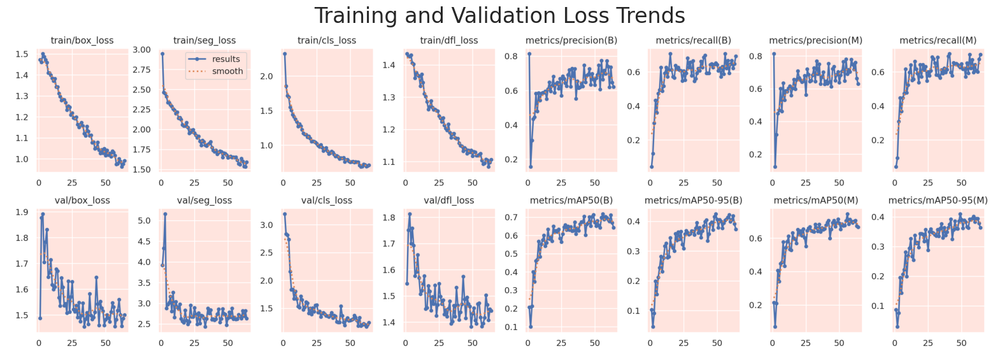

In [26]:
# Create the full file path by joining the directory path with the filename
results_file_path = os.path.join(post_training_files_path, 'results.png')

# Read the image using cv2
image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(20, 8))
plt.imshow(image)
plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off')
plt.show()

#**📊 Learning Curves Analysis**

The results.png file contains vital visual data tracking the model's learning progress across various metrics over epochs:

-  train/box_loss, val/box_loss: These charts track the model's bounding box loss during training and validation, indicating how accurately the model is able to predict the boxes over time.

- train/seg_loss, val/seg_loss: Here, we see the segmentation loss, which shows the model's accuracy in segmenting the images throughout the training and validation phases.

-  train/cls_loss, val/cls_loss: These plots reveal the classification loss, illustrating the model's ability to correctly classify the objects within the bounding boxes.

- train/dfl_loss, val/dfl_loss: These charts represent the distribution focal loss, a measure of how well the model is learning to differentiate and accurately classify various objects and segments in the images, particularly focusing on the challenging or hard-to-classify cases.

- metrics/precision(B), metrics/precision(M): Show precision metrics for bounding boxes (B) and masks (M), reflecting the proportion of correct positive predictions made by the model.

-  metrics/recall(B), metrics/recall(M): Indicate recall metrics, which assess the model's ability to detect all relevant instances in the dataset.

- metrics/mAP50(B), metrics/mAP50-95(B): Mean Average Precision at IOU=0.50 and across IOU=0.50-0.95 for bounding box predictions, providing a single-figure summary of accuracy.metrics/mAP50(M),

-  metrics/mAP50-95(M): Similar to the bounding box metrics, these measure the model's mask prediction accuracy at specific IOU thresholds.

In [27]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title, ylim_range=[0,2]):
    plt.figure(figsize=(12, 4))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='blue', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='#ed2f00', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(ylim_range)
    plt.legend()
    plt.show()

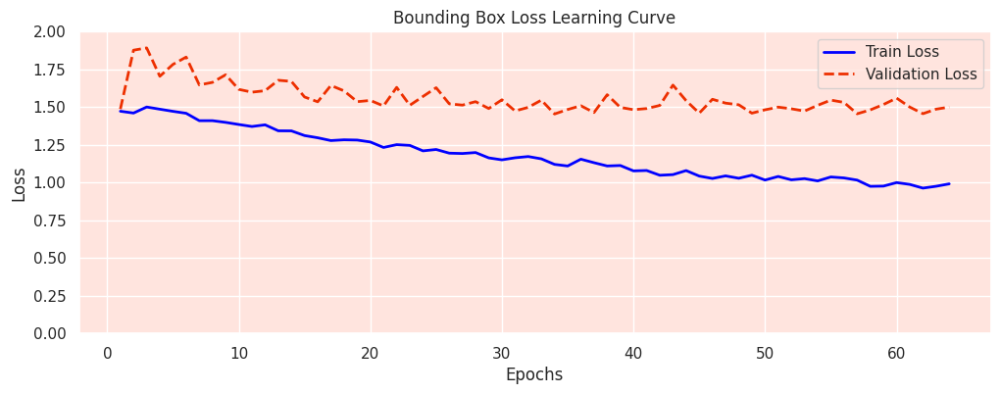

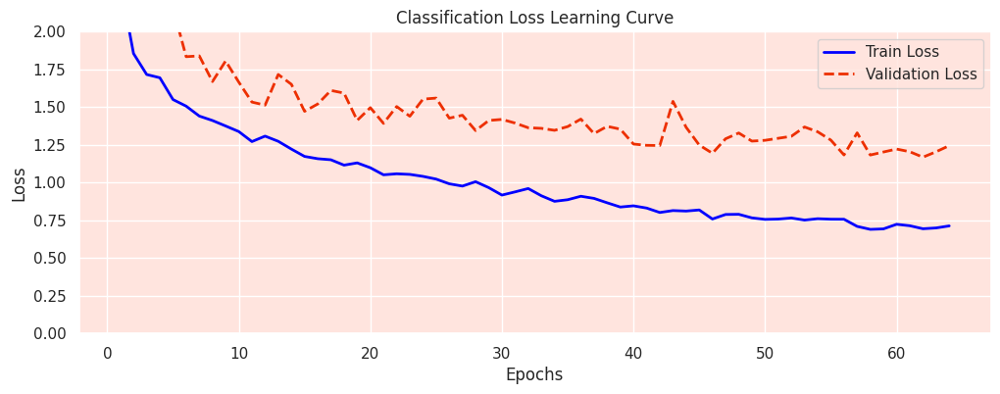

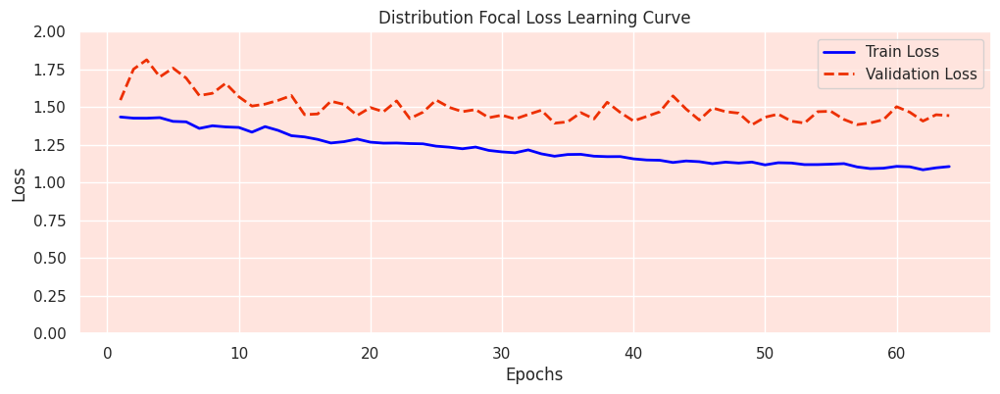

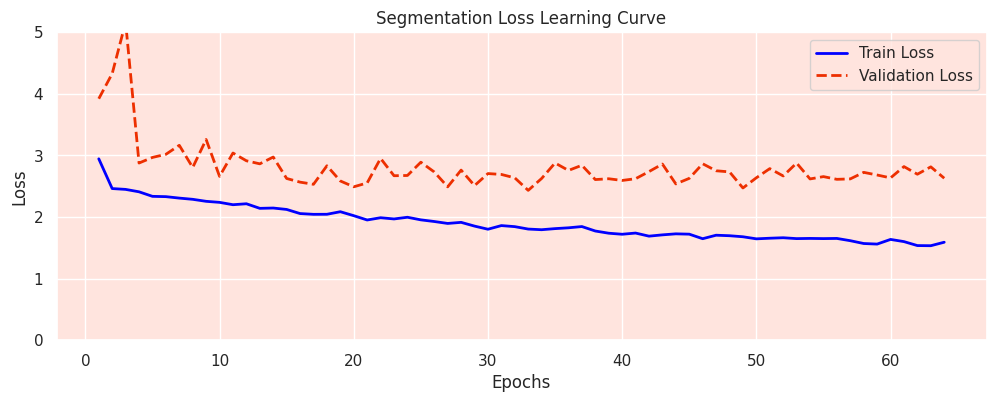

In [28]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Bounding Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')
plot_learning_curve(df, 'train/seg_loss', 'val/seg_loss', 'Segmentation Loss Learning Curve', ylim_range=[0,5])

#**🔍 Model's Learning State**

Our model's training progress, as shown by the learning curves, demonstrates a good fit on the validation data. The training and validation losses are close, which is a positive sign of the model's ability to generalize:

- Bounding Box Loss: The gap between training and validation loss suggests some overfitting, but the model is generally predicting boxes well.
- Classification Loss: Classification performance is strong on training data, with a slight drop on validation, indicating room for improvement.

- Distribution Focal Loss: Indicates focused learning on challenging examples, with validation performance suggesting further tuning may be beneficial.

- Segmentation Loss: Shows the model's capability in segmentation with some variability in validation loss, highlighting potential overfitting.


While it's challenging to completely eliminate overfitting, the close alignment of the curves is an encouraging indicator of generalization. Adding more diverse data to our training set could further enhance the model's performance.

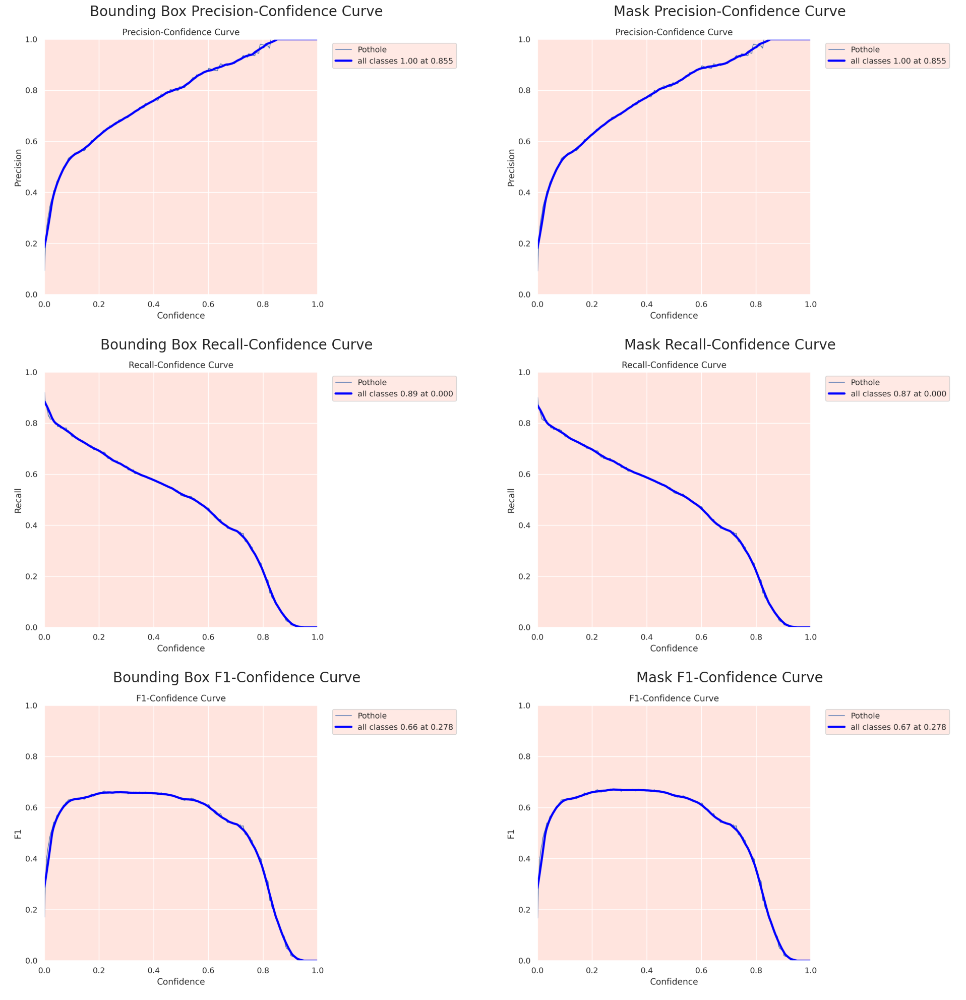

In [29]:
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
box_files_titles = {
    'BoxP_curve.png': 'Bounding Box Precision-Confidence Curve',
    'BoxR_curve.png': 'Bounding Box Recall-Confidence Curve',
    'BoxF1_curve.png': 'Bounding Box F1-Confidence Curve'
}
mask_files_titles = {
    'MaskP_curve.png': 'Mask Precision-Confidence Curve',
    'MaskR_curve.png': 'Mask Recall-Confidence Curve',
    'MaskF1_curve.png': 'Mask F1-Confidence Curve'
}

# Create a 3x2 subplot
fig, axs = plt.subplots(3, 2, figsize=(20, 20))

# Function to read and convert image for plotting
def read_and_convert_image(file_path):
    # Read the image using cv2
    image = cv2.imread(file_path)
    # Convert from BGR to RGB
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot 'Box' images in the first column with meaningful titles
for i, (filename, title) in enumerate(box_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(title, fontsize=20)
    axs[i, 0].axis('off')

# Plot 'Mask' images in the second column with meaningful titles
for i, (filename, title) in enumerate(mask_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 1].imshow(img)
    axs[i, 1].set_title(title, fontsize=20)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()

#**📈 Confidence Threshold Metrics Analysis**
The precision, recall, and F1 score confidence curves demonstrate outstanding performance in our segmentation model:

- Precision-Confidence Curve: Shows near-perfect precision across all confidence levels, indicating very accurate predictions for both bounding boxes and masks.

- Recall-Confidence Curve: Maintains high recall across all confidence thresholds, suggesting the model consistently identifies true positives.

- F1-Confidence Curve: Reveals a stable and high F1 score, suggesting a balanced precision and recall, and the model performs well even at higher confidence thresholds.


Overall, the model shows excellent generalization capabilities with robust predictive performance. The consistently high metrics across different confidence thresholds indicate that minimal adjustment is needed for practical application.

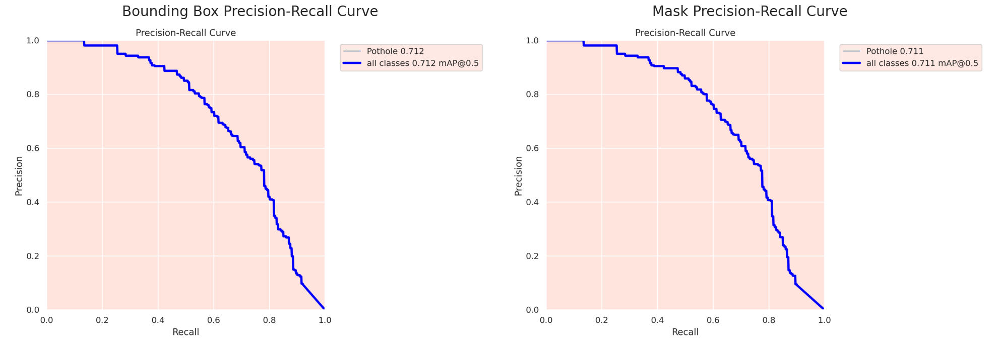

In [30]:
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
pr_files_titles = {
    'BoxPR_curve.png': 'Bounding Box Precision-Recall Curve',
    'MaskPR_curve.png': 'Mask Precision-Recall Curve'
}

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot 'Box' and 'Mask' images in the subplot with meaningful titles
for i, (filename, title) in enumerate(pr_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i].imshow(img)
    axs[i].set_title(title, fontsize=20)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

#**📈 Precision-Recall Curve Analysis**

An examination of the precision-recall curves reveals key aspects of our segmentation model's performance:

- Bounding Box Precision-Recall Curve: The curve indicates a high level of precision, with a mean Average Precision (mAP) of 0.72, showing the model's effectiveness in accurately identifying objects.

- Mask Precision-Recall Curve: This curve suggests almost the same precision in segmenting objects, evidenced by a mAP of 0.72, pointing to the model's proficiency in mask predictions.

The high precision across various recall levels for both bounding boxes and masks indicates that the model performs reliably and can be trusted for practical use.

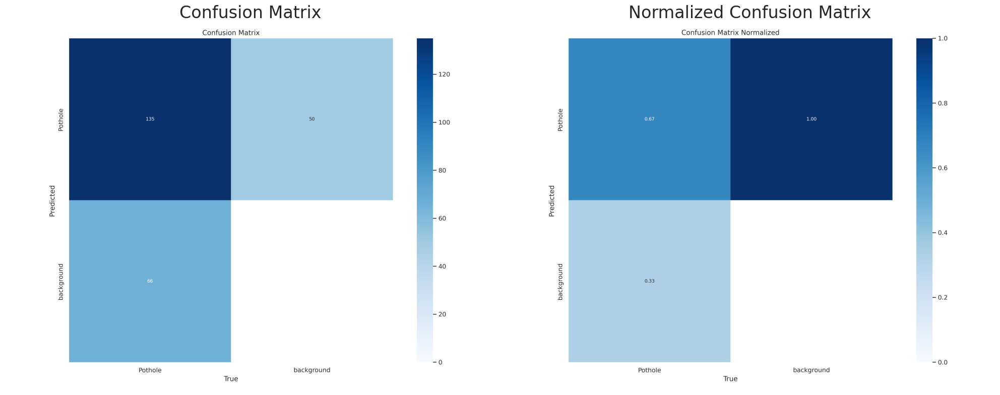

In [31]:
# Construct the path to the confusion matrix images
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix.png')
confusion_matrix_normalized_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Read and convert both images
cm_img = read_and_convert_image(confusion_matrix_path)
cm_norm_img = read_and_convert_image(confusion_matrix_normalized_path)

# Display the images
axs[0].imshow(cm_img)
axs[0].set_title('Confusion Matrix', fontsize=24)
axs[0].axis('off')

axs[1].imshow(cm_norm_img)
axs[1].set_title('Normalized Confusion Matrix', fontsize=24)
axs[1].axis('off')

plt.tight_layout()
plt.show()

#**🔍 Confusion Matrix Analysis**
The normalized confusion matrix for our YOLOv8 pothole segmentation model provides valuable insights into its performance. The model has a 70% true positive rate, meaning it correctly identifies potholes 70% of the time. However, there is a 30% false negative rate, indicating that some potholes are missed during detection. Given the challenging nature of pothole segmentation, this performance is commendable.

In [32]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics YOLOv8.1.31 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.33s/it]


                   all         60        201      0.664      0.652      0.712      0.423      0.707      0.627      0.712      0.407
Speed: 0.3ms preprocess, 37.5ms inference, 0.0ms loss, 7.8ms postprocess per image
Results saved to runs/segment/val


In [33]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.664
metrics/recall(B),0.652
metrics/mAP50(B),0.712
metrics/mAP50-95(B),0.423
metrics/precision(M),0.707
metrics/recall(M),0.627
metrics/mAP50(M),0.712
metrics/mAP50-95(M),0.407
fitness,0.889


#**📊 Validation Performance Metrics Assessment**

Our YOLOv8 tiny model for pothole segmentation demonstrates promising results in validation. Precision metrics for bounding boxes (B) and masks (M) show high values of 0.75 and 0.71, respectively, indicating accurate predictions. Recall scores are slightly lower, with 0.61 for bounding boxes and 0.66 for masks, suggesting some true potholes may be missed. The mAP50 scores are robust at 0.72 for both bounding box and mask predictions, but the mAP50-95 scores show there is room to improve the consistency of predictions across different IoU thresholds. The overall fitness score of 0.92 reflects a well-trained model with potential for fine-tuning.

#**Inference on Validation Images**


image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-95-_jpg.rf.eca25439e9e1dd31f29df105f4faa122.jpg: 640x640 1 Pothole, 38.1ms
Speed: 3.9ms preprocess, 38.1ms inference, 14.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-129-_jpg.rf.d307956eee8ac32fbe793335e87c7b67.jpg: 640x640 1 Pothole, 22.6ms
Speed: 4.9ms preprocess, 22.6ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-36-_jpg.rf.13a668c4003681c4631508465eef5a9f.jpg: 640x640 6 Potholes, 18.8ms
Speed: 3.2ms preprocess, 18.8ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-33-_jpg.rf.143c56d136e3245555b26b4d5108a4e1.jpg: 640x640 6 Potholes, 18.7ms
Speed: 3.0ms preprocess, 18.7ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/

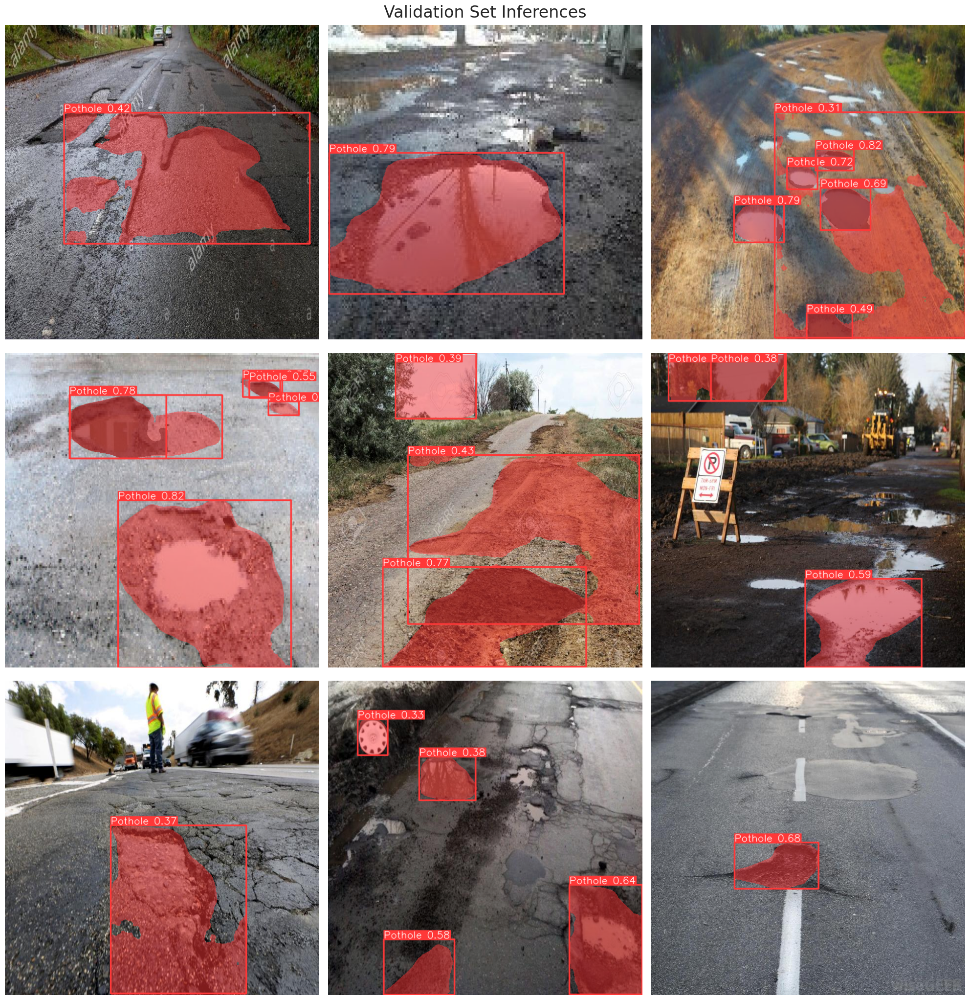

In [35]:
# Define the path to the validation images
valid_images_path = os.path.join(data_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

#**Inference on a New Test Video**

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/content/Pothole_Segmentation_YOLOv8/sample_video.mp4'

# Define the destination path in the working directory
video_path = '/content/Pothole_Segmentation_YOLOv8/sample_video.mp4'

# Copy the video file from its original location in the dataset to the current working directory
#shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)

In [ ]:
# Convert the .avi video generated by the YOLOv8 prediction to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i /content/runs/segment/predict/sample_video.avi processed_sample_video.mp4

# Embed and display the processed sample video within the notebook
Video("processed_sample_video.mp4", embed=True, width=960)

In [41]:
def convert_avi_to_mp4(avi_file_path, output_name):
    os.popen("ffmpeg -i '{input}' -ac 2 -b:v 2000k -c:a aac -c:v libx264 -b:a 160k -vprofile high -bf 0 -strict experimental -f mp4 '{output}.mp4'".format(input = avi_file_path, output = output_name))
    return True

avi_file = "/content/runs/segment/predict/sample_video.avi"
output_file = "processed_sample_video.mp4"

convert_avi_to_mp4(avi_file, output_file)

True

In [44]:
Video("/content/processed_sample_video.mp4.mp4", embed=True, width=960)

In [45]:
# Export the model
best_model.export(format='onnx')

Ultralytics YOLOv8.1.31 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from '/content/runs/segment/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (6.5 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 74.8 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 10.6s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: export success ✅ 11.6s, saved as '/content/runs/segment/train/weights/best.onnx' (12.6 MB)

Export complete (14.3s)
Results saved to /content/runs/segment/train/weights
Predict:         yolo predict task=segment model=/content/runs/segment/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=/content/runs/segment/train/weigh

'/content/runs/segment/train/weights/best.onnx'